In [135]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pickle
from skimage.segmentation import slic
import scipy.ndimage
import scipy.spatial
import torch
from torchvision import datasets
from torchvision import datasets
import sys
sys.path.append("../")
from chebygin import ChebyGIN
from extract_superpixels import process_image
from graphdata import comput_adjacency_matrix_images
from train_test import load_save_noise
from utils import list_to_torch, data_to_device, normalize_zero_one
import imageio
import cv2
import os
from PIL import Image
import networkx as nx

In [142]:
data_dir = '../data'
checkpoints_dir = '../checkpoints'
device = 'cuda'

data_file = '/scratch/ssd/data/graph_attention_pool/random_graphs_triangles_test.pkl'
with open(data_file, 'rb') as f:
    data = pickle.load(f)
    
print(data.keys())
targets = torch.from_numpy(data['graph_labels']).long()
Node_degrees = [np.sum(A, 1).astype(np.int32) for A in data['Adj_matrices']]

feature_dim = data['Max_degree'] + 1
node_features = []
for i in range(len(data['Adj_matrices'])):
    N = data['Adj_matrices'][i].shape[0]
    D_onehot = np.zeros((N, feature_dim ))
    D_onehot[np.arange(N), Node_degrees[i]] = 1
    node_features.append(D_onehot)

edgecolors = [0.3, 0.3, 0.3, 0.1]
edgewidth = 0.5

def get_pooled_graph(A_org, pos, bool_ind):
    idx = np.where(bool_ind)[0]
    A = A_org.copy()
    A = A[:,idx][idx, :]
    G = nx.from_numpy_array(A)
    pos_new = {}
    for j in range(len(idx)):
        pos_new[j] = pos[idx[j]] #+ np.array([0, -0.1])
        
    idx_d = np.where(~bool_ind)[0]
    #print(len(idx_d), bool_ind, len(idx))
    G_dummy = nx.from_numpy_array(A_org[:,idx_d][idx_d, :])
    pos_dummy = {}
    for j in range(len(idx_d)):
        pos_dummy[j] = pos[idx_d[j]]        
    nx.draw_networkx_nodes(G_dummy, pos_dummy, node_color=np.ones((len(pos_dummy), 3)), node_size=0,
                          alpha=0)
    
    #draw_graph(G, pos_new, alpha[idx], cmap, vmin, vmax, ticks)
    return G, pos_new, idx
    
    
def draw_graph_triangles(data, ind, alpha, alpha_unsup, alpha_sup, cm='Purples', layout='spring', node_size=300, edgewidth_=None):
    A = data['Adj_matrices'][ind]
    G = nx.from_numpy_array(A)    
    gt_attn = data['GT_attn'][ind].squeeze()
    gt_attn = gt_attn / (float(np.sum(gt_attn)) + 1e-7)
    fig = plt.figure()
    cmap = plt.cm.get_cmap(cm, len(gt_attn))
    vmin = gt_attn.min()
    vmax = gt_attn.max()
    if layout == 'spring':
        pos = nx.spring_layout(G)
    elif layout == 'shell':
        pos = nx.shell_layout(G)
    else:
        raise NotImplementedError(layout)
    if edgewidth_ is None:
        edgewidth_ = edgewidth
    
    # GT graph
    nx.draw_networkx(G, pos, node_color=gt_attn, with_labels=False, node_size=node_size,
                    width=edgewidth_, edgecolors=edgecolors, cmap=cmap, vmin=vmin, vmax=vmax)  
    plt.axis('off')
    plt.savefig('images/%d_gt.png' % ind)
    plt.show()
    G_pooled, pos_pooled, idx = get_pooled_graph(A, pos, gt_attn > 0)
    nx.draw_networkx(G_pooled, pos_pooled, node_color=gt_attn.squeeze()[idx], with_labels=False, 
                     node_size=node_size, width=edgewidth_, 
                     edgecolors=edgecolors, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.axis('off')
    plt.savefig('images/%d_gt_pooled.png' % ind)
    plt.show()
    
    nx.draw_networkx(G, pos, node_color=alpha, with_labels=False, node_size=node_size,
                    width=edgewidth_, edgecolors=edgecolors, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.axis('off')
    plt.savefig('images/%d_pred.png' % ind)
    plt.show()
    
    G_pooled, pos_pooled, idx = get_pooled_graph(A, pos, alpha > 0.01)
    nx.draw_networkx(G_pooled, pos_pooled, node_color=alpha.squeeze()[idx], with_labels=False, 
                     node_size=node_size, width=edgewidth_, 
                     edgecolors=edgecolors, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.axis('off')
    plt.savefig('images/%d_pred_pooled.png' % ind)
    plt.show()
    
    nx.draw_networkx(G, pos, node_color=alpha_unsup, with_labels=False, node_size=node_size,
                    width=edgewidth_, edgecolors=edgecolors, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.axis('off')
    plt.savefig('images/%d_pred_unsup.png' % ind)
    plt.show()
    
    G_pooled, pos_pooled, idx = get_pooled_graph(A, pos, alpha > 0.0001)
    nx.draw_networkx(G_pooled, pos_pooled, node_color=alpha_unsup.squeeze()[idx], with_labels=False, 
                     node_size=node_size, width=edgewidth_, 
                     edgecolors=edgecolors, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.axis('off')
    plt.savefig('images/%d_pred_unsup_pooled.png' % ind)
    plt.show()
    
    
    nx.draw_networkx(G, pos, node_color=alpha_sup, with_labels=False, node_size=node_size,
                    width=edgewidth_, edgecolors=edgecolors, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.axis('off')
    plt.savefig('images/%d_pred_sup.png' % ind)
    plt.show()
    
    G_pooled, pos_pooled, idx = get_pooled_graph(A, pos, alpha > 0.001)
    nx.draw_networkx(G_pooled, pos_pooled, node_color=alpha_sup.squeeze()[idx], with_labels=False, 
                     node_size=node_size, width=edgewidth_, 
                     edgecolors=edgecolors, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.axis('off')
    plt.savefig('images/%d_pred_sup_pooled.png' % ind)
    plt.show()

dict_keys(['Adj_matrices', 'GT_attn', 'graph_labels', 'N_edges', 'Max_degree'])


In [143]:
def acc(pred):
    n = len(pred)
    #print(n)
    return torch.mean((torch.stack(pred).view(n) == targets[:len(pred)].view(n)).float()).item() * 100

def test(model, index, show_img=False):    
    #['Adj_matrices', 'GT_attn', 'graph_labels', 'N_edges', 'Max_degree']
    
    N_nodes = data['Adj_matrices'][index].shape[0]
    mask = torch.ones(1, N_nodes, dtype=torch.uint8)
    x = torch.from_numpy(node_features[index]).unsqueeze(0).float() 
    A = torch.from_numpy(data['Adj_matrices'][index].astype(np.float32)).float().unsqueeze(0)
    #print(A.shape, A)
    y, other_outputs = model(data_to_device([x, A, mask, -1, {'N_nodes': torch.zeros(1, 1) + N_nodes}], 
                                            device))
    
    y_clean = y.round().long().data.cpu()[0][0]
    #print(y_clean)
    alpha_clean = other_outputs['alpha'][0].data.cpu() if 'alpha' in other_outputs else []
        
    return y_clean, alpha_clean


# This function returns predictions for the entire clean and noise test sets
def get_predictions(model_path):
    state = torch.load(model_path)
    args = state['args']
    model = ChebyGIN(in_features=14,
                     out_features=1,
                     filters=args.filters,
                     K=args.filter_scale,
                     n_hidden=args.n_hidden,
                     aggregation=args.aggregation,
                     dropout=args.dropout,
                     readout=args.readout,
                     pool=args.pool,
                     pool_arch=args.pool_arch)
    model.load_state_dict(state['state_dict'])
    model = model.eval().to(device)
    print(model)    

    # Get predictions
    pred, alpha = [], []
    for index in range(len(data['Adj_matrices'])):
        y = test(model, index, index == 0)
        pred.append(y[0])
        alpha.append(y[1])
        if len(pred) % 100 == 0:
            print('{}/{}, acc clean={:.2f}%,'.format(len(pred), len(data['Adj_matrices']), acc(pred)))
    return pred, alpha

In [138]:
pred, alpha = get_predictions('%s/checkpoint_triangles_230187_epoch100_seed0000111.pth.tar' % checkpoints_dir)

ChebyGINLayer torch.Size([64, 98]) tensor([0.5373, 0.5972, 0.5666, 0.5730, 0.5695, 0.5734, 0.5870, 0.6046, 0.5682,
        0.5942], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([32, 128]) tensor([0.5203, 0.6058, 0.5815, 0.5773, 0.5477, 0.5762, 0.6436, 0.5717, 0.6062,
        0.5599], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([32, 64]) tensor([0.5974, 0.5235, 0.6033, 0.5646, 0.5445, 0.5571, 0.6173, 0.6421, 0.5832,
        0.5658], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([1, 64]) tensor([0.5256], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([64, 448]) tensor([0.5915, 0.5470, 0.5900, 0.5749, 0.5824, 0.5810, 0.5622, 0.5880, 0.5768,
        0.5656], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([32, 128]) tensor([0.5744, 0.6069, 0.5795, 0.5684, 0.5997, 0.5734, 0.5859, 0.5607, 0.5622,
        0.5676], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([32, 64]) tensor([0.5853, 0.5836, 0.6154, 0.6380, 0.5484, 0.4919, 0.6253, 0.6428, 0.5296,
        0.5580], grad

In [139]:
pred_unsup, alpha_unsup = get_predictions('%s/checkpoint_triangles_051609_epoch100_seed0000111.pth.tar' % checkpoints_dir)

ChebyGINLayer torch.Size([64, 98]) tensor([0.5786, 0.5730, 0.5617, 0.5878, 0.5461, 0.5948, 0.5906, 0.5912, 0.5335,
        0.5677], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([32, 128]) tensor([0.5745, 0.5512, 0.6142, 0.6060, 0.5642, 0.6059, 0.5804, 0.5554, 0.6017,
        0.5770], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([32, 64]) tensor([0.5932, 0.5593, 0.5627, 0.6019, 0.5524, 0.6440, 0.5917, 0.6590, 0.6078,
        0.6346], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([1, 64]) tensor([0.5725], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([64, 448]) tensor([0.5852, 0.5747, 0.5673, 0.5769, 0.5656, 0.5823, 0.5840, 0.5799, 0.5815,
        0.5818], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([32, 128]) tensor([0.6090, 0.5671, 0.5828, 0.5906, 0.6003, 0.5523, 0.5744, 0.5403, 0.5639,
        0.5650], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([32, 64]) tensor([0.6284, 0.6083, 0.5712, 0.5842, 0.5590, 0.5947, 0.5660, 0.5510, 0.5604,
        0.5742], grad

In [140]:
pred_sup, alpha_sup = get_predictions('%s/checkpoint_triangles_586710_epoch100_seed0000111.pth.tar' % checkpoints_dir)

ChebyGINLayer torch.Size([64, 98]) tensor([0.5868, 0.5343, 0.5821, 0.5368, 0.5817, 0.6225, 0.5816, 0.6425, 0.6112,
        0.5663], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([32, 128]) tensor([0.5605, 0.5411, 0.5864, 0.6154, 0.5964, 0.5613, 0.5737, 0.6324, 0.5622,
        0.5361], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([32, 64]) tensor([0.5641, 0.5520, 0.5683, 0.6533, 0.5696, 0.5656, 0.5917, 0.5588, 0.5664,
        0.5255], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([1, 64]) tensor([0.6043], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([64, 448]) tensor([0.5725, 0.5978, 0.5919, 0.5923, 0.5529, 0.5834, 0.5674, 0.5685, 0.5794,
        0.5760], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([32, 128]) tensor([0.5670, 0.5793, 0.5711, 0.5918, 0.6000, 0.5854, 0.5477, 0.6037, 0.5623,
        0.5551], grad_fn=<SliceBackward>)
ChebyGINLayer torch.Size([32, 64]) tensor([0.5546, 0.6018, 0.5884, 0.5644, 0.5391, 0.5512, 0.5791, 0.5794, 0.5360,
        0.5288], grad

In [99]:
# shapes = np.array([A.shape[0] for A in data['Adj_matrices']])
# D = np.array([np.sum(A.sum(1) == 0) for A in data['Adj_matrices']])
# idx = np.where((D == 0) & (data['graph_labels'] == 3))[0]
# #print(len(idx))
# for i, ind in enumerate(idx[:2]):    
#     draw_graph_triangles(data, ind, 'Purples')

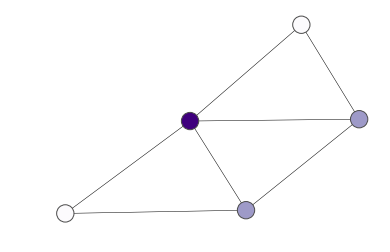

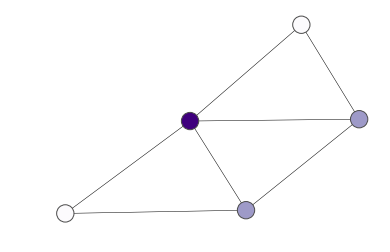

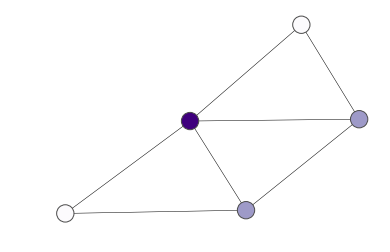

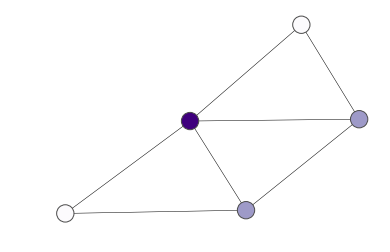

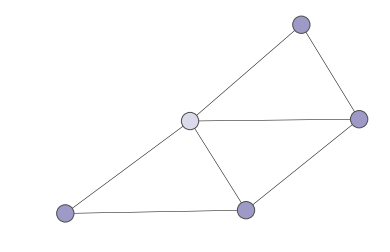

...

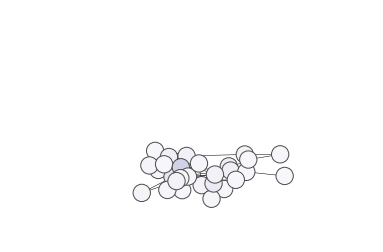

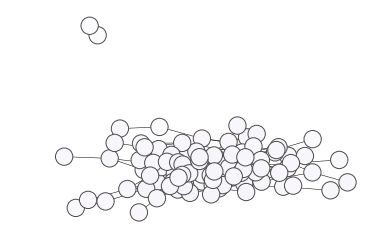

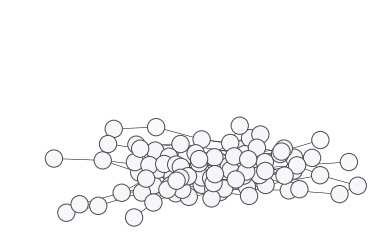

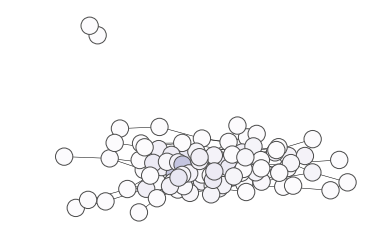

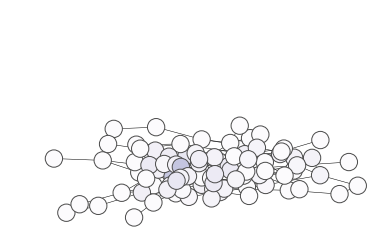

In [144]:
for shape in np.unique(shapes[idx]):
    ind = np.where((shapes == shape) & (D == 0) & (data['graph_labels'] == 3))[0][0]
    draw_graph_triangles(data, ind, 
                         alpha[ind].numpy().squeeze(), 
                         alpha_unsup[ind].numpy().squeeze(), 
                         alpha_sup[ind].numpy().squeeze(),
                         'Purples')

In [145]:
images = []
for shape in np.unique(shapes[idx]):
    ind = np.where((shapes == shape) & (D == 0) & (data['graph_labels'] == 3))[0][0]
    im1 = Image.open('images/%d_gt.png' % ind)
    im2 = Image.open('images/%d_gt_pooled.png' % ind)
    im3 = Image.open('images/%d_pred_unsup.png' % ind)
    im4 = Image.open('images/%d_pred_unsup_pooled.png' % ind)
    im5 = Image.open('images/%d_pred.png' % ind)
    im6 = Image.open('images/%d_pred_pooled.png' % ind)
    im7 = Image.open('images/%d_pred_sup.png' % ind)
    im8 = Image.open('images/%d_pred_sup_pooled.png' % ind)
    im1 = np.concatenate((im1, im2), axis=1)
    im2 = np.concatenate((im3, im4), axis=1)
    im3 = np.concatenate((im5, im6), axis=1)
    im4 = np.concatenate((im7, im8), axis=1)
    im = np.concatenate((im1, im2, im4, im3), axis=0)
    images.append(im)    

In [146]:
imageio.mimsave('../data/triangles_animation2.gif', images, format='GIF', duration=1.5)
#imageio.mimsave('attn.gif', attn, format='GIF', duration=0.5)

In [134]:
shapes[idx].min(), shapes[idx].max()

(5, 92)